# **Summary**

# **Data**

The dataset employed in this study is the "Diabetes 130-US hospitals for years 1999-2008" dataset, a comprehensive repository of electronic health records (EHRs) from various hospitals across the United States. These EHRs encompass a broad spectrum of information related to diabetes patients admitted to these hospitals during the years 1999 to 2008. 
The dataset was obtained from the UCI Machine Learning Repository. It was originally sourced from the Health Facts database, which collects data from a multitude of hospitals across the United States. The dataset was anonymized and compiled for research purposes, ensuring patient privacy and compliance with ethical standards.

The dataset comprises a substantial volume of data, with approximately 100,000 records, each representing a unique patient encounter. It is structured as a comma-separated values (CSV) file, facilitating ease of access and manipulation. The dataset consists of 50 columns, encompassing both numerical and categorical attributes. Each column provides distinct information about the patient encounter, including patient demographics, medical diagnoses, treatment procedures, and outcomes.

The features within the dataset encompass a wide array of patient and hospital-related attributes. Key features include:

- **Patient Demographics:** This category includes patient-related information such as age, gender, and race, enabling a comprehensive understanding of the patient population under consideration.

- **Diagnosis Codes:** The dataset includes three primary diagnosis codes (diag_1, diag_2, diag_3), which are essential for identifying the primary medical condition that led to hospitalization. These codes are classified according to the International Classification of Diseases (ICD) system.

- **Treatment Procedures:** Information about medical procedures and treatments administered to patients during their hospital stay is captured. This category aids in understanding the therapeutic interventions provided to patients.

- **Medication and Dosages:** Details about the medications prescribed to patients, including their names and dosages, are included. This information is crucial for medication-related analysis.

- **Outcome Variable:** The dataset contains a target variable "readmitted," which indicates whether a patient was readmitted within 30 days, after 30 days, or not readmitted.


# **Imports**

In [17]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.subplots as sp
from scipy import stats
import math
from sklearn.feature_selection import mutual_info_classif, SelectKBest, chi2, f_classif, RFE, RFECV
from sklearn.preprocessing import StandardScaler, LabelEncoder, OneHotEncoder, OrdinalEncoder, label_binarize
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import Lasso
from tqdm import tqdm
from sklearn.decomposition import PCA
from sklearn.model_selection import GridSearchCV, KFold, train_test_split, StratifiedKFold, RandomizedSearchCV
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc
from plotly.subplots import make_subplots
from imblearn.over_sampling import SVMSMOTE, BorderlineSMOTE, SMOTE
from sklearn.compose import ColumnTransformer
from imblearn.pipeline import Pipeline
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
import xgboost as xgb
from xgboost import XGBClassifier
from scikeras.wrappers import KerasClassifier
from keras.models import Sequential
from keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout
from keras.optimizers import Adam
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from kerastuner.tuners import RandomSearch


# **Data Preprocessing**

In [20]:
diab_df=pd.read_csv('/Users/vladandreichuk/Desktop/Comparative-Analysis-of-ML-Algorithms-Predicting-Hospital-Readmission-of-Diabetes-Patients/diabetic_data.csv')

## **Preliminary Feature Cleaning**


In my approach to preprocessing the diabetes patient dataset, I started by loading the data into a Pandas DataFrame named diab_df. A preliminary examination using diab_df.info() provided essential insights into the dataset's structure and data types, laying the foundation for subsequent decisions.

The challenge of missing values was tackled head-on. Prinitng out the head of the dataset revealed that the missing values are shown as '?', so I opted to replace '?' with NaN using diab_df.replace('?', np.nan, inplace=True). This choice is neccesary so that later I could apply various imputation strategies as they mostly only recognize 'NaN' values and not '?'.

I also noticed that columns 'A1Cresult' and 'max_glu_serum' contain 'None' values, which represent the fact that the corresponding test was not taken rather than indicating a missing value. To prevent any confusion in the future (some tools interprete these values as missing), I replaced 'None' with 'No'.

To refine the dataset, I identified and removed columns with a single unique value using diab_df.columns[diab_df.nunique() == 1]. This step ensured that only features with meaningful variability were retained, contributing to a more focused and efficient dataset for analysis. This method identified two columns - 'examide', 'citoglipton' - that only contain 1 value. In addition to these columns Columns 'encounter_id', 'patient_nbr', and 'payer_code' were also dropped as they were deemed irrelevant to the predictive task.

Given the map of IDs that the dataset came with, I noticed that some IDs in a 'discharge_disposition_id' column represent patients who died at some point. To adress this issue, I strategically removed instances associated with specific patient IDs, acknowledging the impossibility of readmission for this subset. This precision in data exclusion aligns with the overarching goal of constructing a predictive model grounded in realistic scenarios.

In [ ]:
# Display the top rows of the dataset
diab_df

,encounter_id,patient_nbr,race,gender,age,weight,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,...,citoglipton,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,2278392,8222157,Caucasian,Female,[0-10),?,6,25,1,1,...,No,No,No,No,No,No,No,No,No,NO
1,149190,55629189,Caucasian,Female,[10-20),?,1,1,7,3,...,No,Up,No,No,No,No,No,Ch,Yes,>30
2,64410,86047875,AfricanAmerican,Female,[20-30),?,1,1,7,2,...,No,No,No,No,No,No,No,No,Yes,NO
3,500364,82442376,Caucasian,Male,[30-40),?,1,1,7,2,...,No,Up,No,No,No,No,No,Ch,Yes,NO
4,16680,42519267,Caucasian,Male,[40-50),?,1,1,7,1,...,No,Steady,No,No,No,No,No,Ch,Yes,NO
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101761,443847548,100162476,AfricanAmerican,Male,[70-80),?,1,3,7,3,...,No,Down,No,No,No,No,No,Ch,Yes,>30
101762,443847782,74694222,AfricanAmerican,Female,[80-90),?,1,4,5,5,...,No,Steady,No,No,No,No,No,No,Yes,NO
101763,443854148,41088789,Caucasian,Male,[70-80),?,1,1,7,1,...,No,Down,No,No,No,No,No,Ch,Yes,NO
101764,443857166,31693671,Caucasian,Female,[80-90),?,2,3,7,10,...,No,Up,No,No,No,No,No,Ch,Yes,NO


In [ ]:
# Display the summary of the columns
diab_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101766 entries, 0 to 101765
Data columns (total 50 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   encounter_id              101766 non-null  int64 
 1   patient_nbr               101766 non-null  int64 
 2   race                      101766 non-null  object
 3   gender                    101766 non-null  object
 4   age                       101766 non-null  object
 5   weight                    101766 non-null  object
 6   admission_type_id         101766 non-null  int64 
 7   discharge_disposition_id  101766 non-null  int64 
 8   admission_source_id       101766 non-null  int64 
 9   time_in_hospital          101766 non-null  int64 
 10  payer_code                101766 non-null  object
 11  medical_specialty         101766 non-null  object
 12  num_lab_procedures        101766 non-null  int64 
 13  num_procedures            101766 non-null  int64 
 14  num_

In [21]:
#Since missing values are represented as ?, change them to NaN
diab_df.replace('?', np.nan, inplace=True)

In [22]:
# Prevent 'None' values being interpreted as np.nan
diab_df['A1Cresult'] = diab_df['A1Cresult'].replace(np.nan,'No')
diab_df['max_glu_serum'] = diab_df['max_glu_serum'].replace(np.nan,'No')

In [23]:
# Find columns with only one unique value
single_unique_columns = diab_df.columns[diab_df.nunique() == 1]

single_unique_columns

Index(['examide', 'citoglipton'], dtype='object')

In [24]:
# Drop irrelevant columns from the DataFrame
columns_to_drop = ['encounter_id', 'patient_nbr', 'payer_code','examide','citoglipton']
diab_df = diab_df.drop(columns_to_drop, axis=1)

In [25]:
# Delete all rows where patients deceseased since there is no possibility for them to be readmitted
# List of IDs that correspond to dead patients based on the mapping provided with the dataset
values_to_remove = [11, 19, 20, 21]

# Filter and remove rows with 'discharge_disposition_id' in the specified values
diab_df = diab_df[~diab_df['discharge_disposition_id'].isin(values_to_remove)]

## **Missing Values**

Continuing with the handling of missing values, I extended the exploration to columns with a substantial proportion of missing data, such as 'weight' and 'medical_specialty'. The decision to drop these columns was driven by the recognition that, due to an extremely large proportion of missing values, imputing or retaining them might introduce bias or noise into the analysis. Simultaneously, I opted to impute missing values in a categorical columns 'race' with their mode using fillna() method, ensuring the preservation of the categorical distribution. For columns 'diag_1', 'diag_2', 'diag_3', which had a very small proportion of missing data, I replaced them with a value 'Unknown' as this way, we are not loosing too much information and not imputing the missing values with misleading diagnosis codes.

Duplicates were identified and removed using diab_df.drop_duplicates(inplace=True). Eliminating duplicate rows was a critical step to ensure each patient's record was a unique representation, preventing potential bias in subsequent analyses.

In [ ]:
diab_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 100114 entries, 0 to 101765
Data columns (total 45 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   race                      97875 non-null   object
 1   gender                    100114 non-null  object
 2   age                       100114 non-null  object
 3   weight                    3156 non-null    object
 4   admission_type_id         100114 non-null  int64 
 5   discharge_disposition_id  100114 non-null  int64 
 6   admission_source_id       100114 non-null  int64 
 7   time_in_hospital          100114 non-null  int64 
 8   medical_specialty         50985 non-null   object
 9   num_lab_procedures        100114 non-null  int64 
 10  num_procedures            100114 non-null  int64 
 11  num_medications           100114 non-null  int64 
 12  number_outpatient         100114 non-null  int64 
 13  number_emergency          100114 non-null  int64 
 14  number_in

In [26]:
#Drop 'weight' column due to largely missing values
diab_df = diab_df.drop(['weight','medical_specialty'], axis=1)


In [27]:
# Display the missing values count for each feature
diab_df.isnull().sum()


race                        2239
gender                         0
age                            0
admission_type_id              0
discharge_disposition_id       0
admission_source_id            0
time_in_hospital               0
num_lab_procedures             0
num_procedures                 0
num_medications                0
number_outpatient              0
number_emergency               0
number_inpatient               0
diag_1                        21
diag_2                       358
diag_3                      1421
number_diagnoses               0
max_glu_serum                  0
A1Cresult                      0
metformin                      0
repaglinide                    0
nateglinide                    0
chlorpropamide                 0
glimepiride                    0
acetohexamide                  0
glipizide                      0
glyburide                      0
tolbutamide                    0
pioglitazone                   0
rosiglitazone                  0
acarbose  

In [28]:
# Impute the missing values in the race column with its mode
diab_df['race'].fillna(diab_df['race'].mode()[0], inplace=True)


In [29]:
# Impute the missing values in the 'diag' columns with 'Unknown'
cols_to_impute = ['diag_1', 'diag_2', 'diag_3']
for col in cols_to_impute:
    diab_df[col].fillna('Unknown', inplace=True)

In [31]:
diab_df.isnull().sum()

race                        0
gender                      0
age                         0
admission_type_id           0
discharge_disposition_id    0
admission_source_id         0
time_in_hospital            0
num_lab_procedures          0
num_procedures              0
num_medications             0
number_outpatient           0
number_emergency            0
number_inpatient            0
diag_1                      0
diag_2                      0
diag_3                      0
number_diagnoses            0
max_glu_serum               0
A1Cresult                   0
metformin                   0
repaglinide                 0
nateglinide                 0
chlorpropamide              0
glimepiride                 0
acetohexamide               0
glipizide                   0
glyburide                   0
tolbutamide                 0
pioglitazone                0
rosiglitazone               0
acarbose                    0
miglitol                    0
troglitazone                0
tolazamide

## **Duplicates**

In [30]:
# Check for and remove duplicate rows
diab_df.drop_duplicates(inplace=True)

## **Outliers**

Then, I delved into outlier detection and handling. Boxplots of numerical variables provided a visual representation of their distribution, ranges, and outlier presence. Z-scores were calculated using stats.zscore() to identify outliers. I set a threshold of 3 standard deviations for outlier identification, a common practice in the field. This means that any data point that is more than 3 standard deviations away from the mean is classified as an outlier. Using the Z-score technique, I have also computed the proportion of outliers in each numerical feature, which did not exceed 2% across all features. Given such a small porportion of outliers, I decided to simply create a boolean column 'Matches', indicating if the observation contains at least one outlier value across all features. To further explore if being classified as an outlier effects readmission type, I used a bar plot to see the distribution of 'readmitted' categories for the patients who are classified as outliers and those who are not. In addition, I displayed a bar plot of the number of patients that are outliers and that are not, coloured by their 'readmitted' category. Thus way, I was able to see that the number of 'outlier' patients is much less than the 'non-outlier' patients, making the previous 'readmitted' proportion comparison not ideal. Overall, no significant difference was observed, so I decided to leave the outlier column and not impute the outlier values.

In [ ]:
def readmitted_by_feature(metric):
    """
    This function groups the data by the specified 'metric' and 'readmitted' status, calculates the percentage of readmitted patients for each category, and creates a bar plot using Plotly Express.
    The resulting plot displays the distribution of readmission percentages across categories of the specified 'metric,' providing insights into how different factors may affect patient readmission rates.

    Parameters:
        metric (str): The name of the feature (column) used for grouping data and creating the bar plot.
    """
    # Group the data by 'metric' and 'readmitted', and calculate the count for each combination
    grouped_data = diab_df.groupby([metric, 'readmitted']).size().unstack()

    # Calculate the percentage of readmitted patients for each category
    total_counts = grouped_data.sum(axis=1)
    for col in grouped_data.columns:
        grouped_data[col] = (grouped_data[col] / total_counts) * 100

    # Calculate the sum of percentages in '<30' and '>30' categories and sort by it
    grouped_data['sum_percentages'] = grouped_data['<30'] + grouped_data['>30']
    grouped_data = grouped_data.sort_values(by='sum_percentages', ascending=True)
    grouped_data.drop(columns='sum_percentages', inplace=True)

    # Create a DataFrame for Plotly
    grouped_data_reset = grouped_data.reset_index()

    # Create the bar plot using Plotly
    fig = px.bar(grouped_data_reset, x=metric, y=['<30', '>30', 'NO'], barmode='relative',
                 labels={metric: metric, 'value': 'Percentage'},
                 color_discrete_sequence=px.colors.qualitative.Pastel,
                 title=f'Readmission Patient Percentage by {metric}')

    # Customize the plot layout
    fig.update_layout(xaxis_title=metric, yaxis_title='Percentage', legend_title_text='Readmission Category')

    # Display the plot
    fig.show()

In [ ]:
def boxplot_num_vars(df, columns, names, show_percentages):
    """
    This function generates a set of subplots with boxplots for the specified columns, each subplot labeled with the provided titles.
    
    Parameters:
        df (DataFrame): The DataFrame containing the data.
        columns (list): A list of column names to create boxplots for.
        names (list): A list of titles for the boxplots.
        show_percentages (bool, optional): If True, display the percentage of outliers next to each boxplot. Default is False.
    """
    # Create subplots
    fig = sp.make_subplots(rows=2, cols=4, subplot_titles=names, vertical_spacing=0.1)

    # Create boxplots for each column
    for i, column in enumerate(columns):
        row = i // 4 + 1
        col = i % 4 + 1

        # Calculate Z-scores for the current column
        z_scores = stats.zscore(df[column])

        # Identify outliers based on Z-scores
        outliers = (z_scores > 3) | (z_scores < -3)  # You can adjust the threshold if needed

        # Compute the percentage of outliers
        percentage_outliers = (sum(outliers) / len(df)) * 100

        # Create the subtitle with or without the percentage of outliers
        if show_percentages==True:
            fig.layout.annotations[i].update(text=f'{names[i]} (Outliers: {percentage_outliers:.2f}%)')


        trace = go.Box(y=df[column], name=names[i], boxmean=True, orientation='v')
        fig.add_trace(trace, row=row, col=col)

        # Remove y-axis tick labels
        fig.update_xaxes(showticklabels=False, row=row, col=col)

    # Update layout
    fig.update_layout(
        title="Distributions of Numerical Variables",
        showlegend=False
    )

    # Show the plot
    fig.show()

In [ ]:
# Define the columns of interest and corresponding names
columns_of_interest = ['time_in_hospital', 'num_lab_procedures', 'num_procedures', 'num_medications',
                        'number_outpatient', 'number_emergency', 'number_inpatient', 'number_diagnoses']
names = ['Time in Hospital (Days)', 'Lab Procedures', 'Procedures', 'Medications',
         'Outpatient Visits', 'Emergency Room Visits', 'Inpatient Visits', 'Diagnoses']

In [ ]:
# Visualize the outliers
boxplot_num_vars(diab_df, columns_of_interest, names,show_percentages=True)

In [32]:
# Create a column indicating if the patient is an outlier or not

# Specify the threshold for Z-score
threshold = 3

# Calculate Z-scores for all numerical columns
z_scores = stats.zscore(diab_df.select_dtypes(include=['number']))

# Identify outliers based on Z-scores
outliers = (z_scores > threshold).any(axis=1)

# Create the 'outliers' column in the DataFrame
diab_df['outliers'] = outliers

# Check how many outliers are there
diab_df['outliers'].value_counts()

outliers
False    90042
True     10072
Name: count, dtype: int64

In [ ]:
# Create a bar plot to visualize the distribution of 'readmitted' with respect to outliers
readmitted_by_feature('outliers')

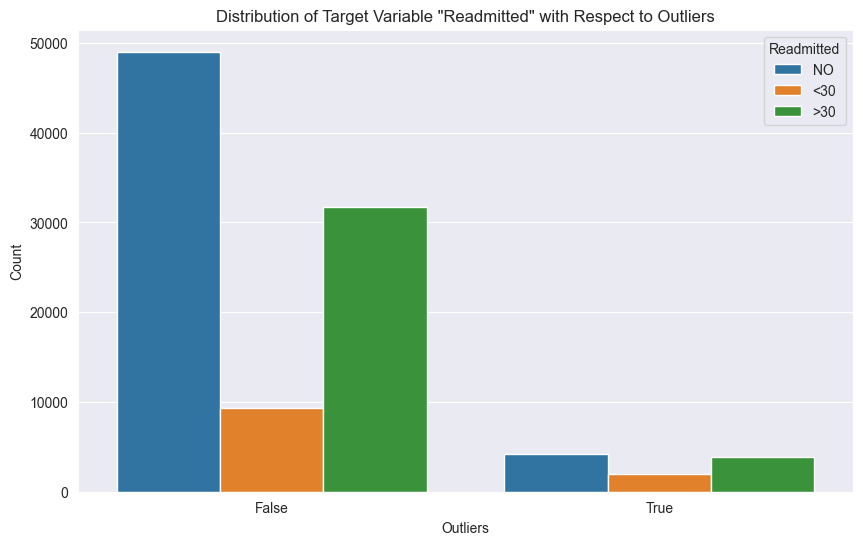

In [ ]:
# Create an alternative bar plot to visualize the distribution of 'readmitted' with respect to outliers
plt.figure(figsize=(10, 6))
sns.set_style("darkgrid")
sns.countplot(x='outliers', hue='readmitted', data=diab_df,hue_order=['NO','<30','>30'])

# Customize the plot
plt.title('Distribution of Target Variable "Readmitted" with Respect to Outliers')
plt.xlabel('Outliers')
plt.ylabel('Count')
plt.legend(title='Readmitted', loc='upper right')

# Show the plot
plt.show()


## **Feature Engineering**

Feature engineering took center stage as categorical columns 'admission_type_id', 'discharge_disposition_id', and  'admission_source_id' were appropriately converted to the 'object' data type. This transformation was achieved using astype('object'). Simultaneously, I addressed the bias that could be introduced by imbalanced features through binarization of highly skewed features as determined during outlier analysis - 'number_outpatient','number_emergency', creating new binary columns - 'outpatient' and 'emergency'. This strategic move not only mitigated the impact of extreme values but also enriched the dataset with binary indicators.

A nuanced approach to handling diagnostic codes ('diag_1', 'diag_2', 'diag_3') was introduced through a mapping function named assign_group. This function categorized ICD-9 codes into broader medical groups according to the mapping instructions that came with the dataset, transcending the numeric nature of codes and providing a semantic layer aligned with clinical intuition. This decision enhanced the interpretability of these features in subsequent analyses.

In [33]:
# Convert specified columns to 'object' type 
diab_df['admission_type_id'] = diab_df['admission_type_id'].astype('object')
diab_df['discharge_disposition_id'] = diab_df['discharge_disposition_id'].astype('object')
diab_df['admission_source_id'] = diab_df['admission_source_id'].astype('object')

In [34]:
# Check the distribution of a potentially highly skewed feature
diab_df['number_inpatient'].value_counts(normalize = True)

number_inpatient
0     0.665961
1     0.191412
2     0.073736
3     0.033172
4     0.015862
5     0.007991
6     0.004765
7     0.002637
8     0.001458
9     0.001109
10    0.000589
11    0.000489
12    0.000340
13    0.000180
14    0.000100
15    0.000090
16    0.000060
19    0.000020
17    0.000010
21    0.000010
18    0.000010
Name: proportion, dtype: float64

In [35]:
# Binarise the highly skewed columns and rename them
diab_df['outpatient'] = np.where(diab_df['number_outpatient']==0,0,1)
diab_df['emergency'] = np.where(diab_df['number_emergency']==0,0,1)
diab_df = diab_df.drop('number_outpatient',axis=1)
diab_df = diab_df.drop('number_emergency',axis=1)


In [36]:
for col in ['diag_1','diag_2','diag_3']:
    # Convert the column to numeric, coercing errors to NaN for values that can't be converted
    diab_df[col] = pd.to_numeric(diab_df[col], errors='coerce')

    # Fill NaN values with the default float value (e.g., -1)
    diab_df[col] = diab_df[col].fillna(float(-1))

In [37]:
def assign_group(code):
    """
    Assign a medical group based on the ICD-9 code.

    Parameters:
      code (int): The ICD-9 code to be categorized.

    Returns:
    str: The medical group corresponding to the provided ICD-9 code.
         Possible groups include 'Circulatory', 'Respiratory', 'Digestive',
         'Diabetes', 'Injury', 'Musculoskeletal', 'Genitourinary', 'Neoplasm',
         or 'Other'.
    """
    if 390 <= code <= 459 or code == 785:
        return 'Circulatory'
    elif 460 <= code <= 519 or code == 786:
        return 'Respiratory'
    elif 520 <= code <= 579 or code == 787:
        return 'Digestive'
    elif 250 <= code < 251:
        return 'Diabetes'
    elif 800 <= code <= 999:
        return 'Injury'
    elif 710 <= code <= 739 :
        return 'Musculoskeletal'
    elif 580 <= code <= 629 or code == 788 :
        return 'Genitourinary'
    elif 140 <= code <= 239:
        return 'Neoplasm'
    elif 780 <= code <= 781 or code == 784 or 790 <= code <= 799:
        return 'Neoplasm'
    elif 240 <= code <= 279:
        return 'Neoplasm'
    elif 680 <= code <= 709 or code == 782:
        return 'Neoplasm'
    elif 1 <= code <= 139:
        return 'Neoplasm'
    elif 290 <= code <= 319:
        return 'Neoplasm'
    else:
        return 'Other'

# Apply the function to 'diag_1', 'diag_2', and 'diag_3' columns
diab_df['diag_1'] = diab_df['diag_1'].map(assign_group)
diab_df['diag_2'] = diab_df['diag_2'].map(assign_group)
diab_df['diag_3'] = diab_df['diag_3'].map(assign_group)

In [38]:
diab_df['diag_1'].value_counts()

diag_1
Circulatory        29881
Neoplasm           15934
Respiratory        14074
Digestive           9380
Diabetes            8693
Injury              6881
Other               5273
Genitourinary       5054
Musculoskeletal     4944
Name: count, dtype: int64

# **Dimensionality Reduction**

In the exploration of dimensionality reduction techniques for the diabetes patient dataset, a comprehensive analysis was initiated with correlation analysis. Selecting only numeric columns, a correlation matrix was calculated and visually represented through a heatmap using seaborn. This initial step laid the foundation for understanding the relationships between numerical features, providing insights into potential multicollinearity and guiding subsequent feature selection methods.

Moving on to Chi2 analysis, the target variable ('readmitted') was separated from the features. Ordinal encoding was applied to transform categorical features into numerical representations, facilitating the application of Chi-squared tests using SelectKBest. The average Chi2 results were calculated over multiple iterations to ensure stability and reliability. The resulting Chi-squared values for each feature were then visualized in a bar plot, offering a comprehensive overview of their significance in predicting readmission.

The exploration extended to Mutual Information (MI) analysis, leveraging SelectKBest with mutual_info_classif as the scoring function. Similar to Chi2 analysis, the process involved multiple iterations to obtain robust average MI scores. Feature importance scores were extracted and visualized to discern the relevance of each feature in predicting readmission.

ANOVA F-test analysis was introduced as another dimensionality reduction method. Employing SelectKBest with f_classif, the average F-test results were calculated over numerous iterations. Feature importance scores were then showcased in a bar plot, aiding in the identification of features contributing significantly to the prediction of readmission.

Recursive Feature Elimination (RFE) emerged as a sophisticated technique to systematically remove less important features. Implemented with a Random Forest Classifier, the process involved iteratively fitting the model and updating a progress bar. The resulting feature importances were visualized through a bar chart, providing a clear ranking of features based on their importance.

Lasso regression, a regularization method, was applied to identify and eliminate features with coefficients equal to zero. The features were scaled using StandardScaler to ensure the regularization term's effectiveness. GridSearchCV was employed for hyperparameter tuning, and the final Lasso model was utilized to obtain feature importances. The importance of each feature was visualized in a bar chart, aiding in the identification of critical features.

To consolidate results across all methods, a temporary DataFrame was created to track features selected for removal by each technique. A 'Matches' column counted how many times each feature was identified for removal across all applied methods. Features selected at least four times were considered for removal, and the final dataset, named 'diab_df_filtered', was obtained by dropping these features.

In summary, the dimensionality reduction process employed a diverse set of techniques, including correlation analysis, Chi2 analysis, Mutual Information analysis, ANOVA F-test analysis, Recursive Feature Elimination (RFE), and Lasso regression. Each method brought unique insights into feature importance and complemented the overall goal of identifying a reduced set of features with high predictive power for readmission. The final dataset, 'diab_df_filtered', reflects a refined feature set that retains critical information while mitigating the impact of less relevant features, laying the groundwork for subsequent modeling endeavors.

## **Correlation Analysis**

In the exploration of dimensionality reduction techniques for the diabetes patient dataset, a comprehensive analysis was initiated with correlation analysis. Selecting only numeric columns, a correlation matrix was calculated and visually represented through a heatmap using seaborn. This initial step laid the foundation for understanding the relationships between numerical features, providing insights into potential multicollinearity and guiding subsequent feature selection methods.

Correlation analysis can help identify relationships between numerical features, where high correlations would suggest redundancy, which means that those features may be providing similar information. Redundant features don't necessarily add value to your model and can lead to overfitting, which is why this analysis can help us decide which features to exclude from further modeling.

To perform the analysis, we used the .corr() method, which in our context computes the Pearson correlation coefficient. The correlation coefficient is a normalized measure of the covariance between two variables, calculated as the ratio of their covariance to the product of their standard deviations:

$$r_{X,Y} = \frac{{\text{{cov}}(X,Y)}}{{\text{{sd}}(X) \cdot \text{{sd}}(Y)}}$$
where
- ${\text{{sd}}(X)} $ is the standard deviation  of X.
- ${\text{{sd}}(Y)}$ is the standard deviation of Y.
- ${\text{{cov}}(X,Y)}$ is the covariance.


This normalization ensures that the resulting value always falls within the range of -1 to 1. Similar to covariance, the correlation coefficient specifically captures linear relationships between variables, disregarding various other forms of relationships or correlations. 

A positive value close to 1 indicates a strong positive correlation, meaning that as one variable increases, the other tends to increase as well. Conversely, a negative value close to -1 suggests a strong negative correlation, meaning that as one variable increases, the other tends to decrease. A correlation value close to 0 indicates a weak or no linear relationship.

From the heatmap below, we can see that most features are almost uncorrelated. The highest correlation of 0.46 was found between ‘num_medications and ‘time_in_hospital’, which is still quite insignificant and can be intuitively explained by the fact that people who spent more time in the hospital had more days to receive medications. These small correlations suggest to us that we did not find features with potentially very similar explanatory power, hence we should not immediately discard any features. To better understand the features and their impact, we conducted further statistical analysis.

In [ ]:
# Select only the numeric columns for correlation analysis
num_cols_df= diab_df.select_dtypes(include=['number'])

# Calculate the correlation matrix for the numeric columns
correlation_matrix = num_cols_df.corr()

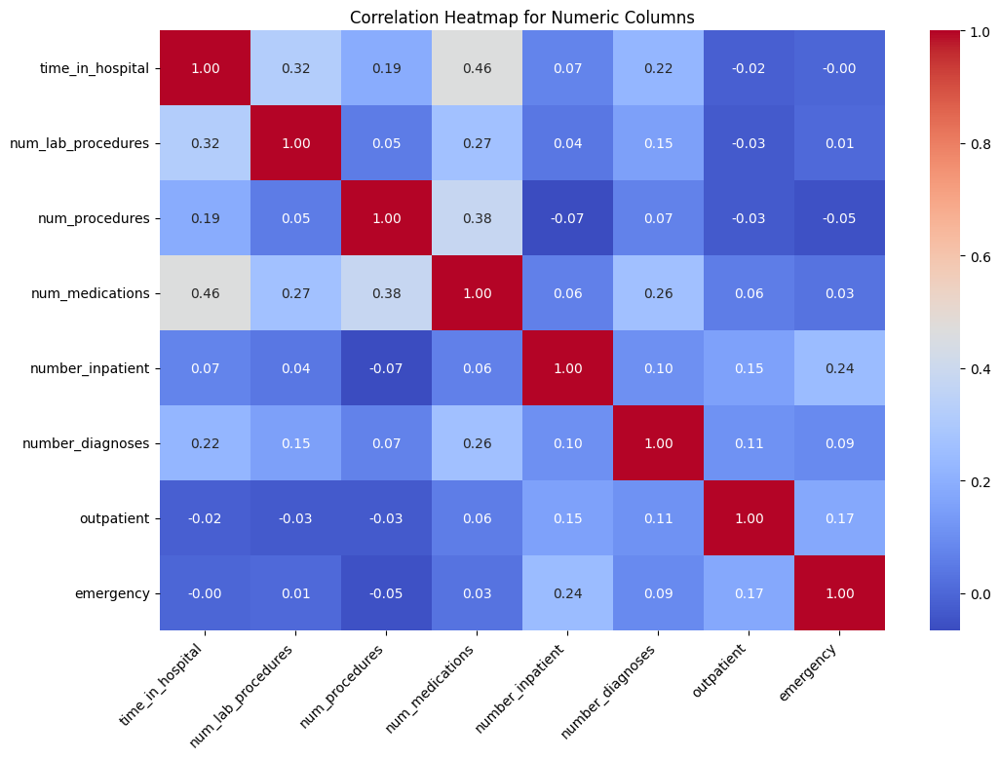

In [ ]:
# Create a heatmap
plt.figure(figsize=(12, 8))
heatmap = sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")

# Rotate x-ticks
heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=45, ha='right')
plt.title("Correlation Heatmap for Numeric Columns")
plt.show()

## **Chi2 Analysis**

The Chi-squared (χ²) test is a statistical method used to assess the independence of categorical variables in a contingency table. It's a fundamental tool in statistics for detecting associations between variables. The test evaluates whether there is a significant association between two categorical variables by comparing observed frequencies to expected frequencies under the assumption of independence. Chi-squared tests come in two main forms: the Chi-squared test of independence and the Chi-squared goodness-of-fit test. In our project, the focus is on the Chi-squared test of independence. 

The Chi-squared test of independence assesses whether two categorical variables are related or independent. The underlying concept involves constructing a contingency table, which cross-tabulates the two variables to compare observed frequencies to what would be expected if the variables were independent. 

The Chi-squared statistic (in the context of independence) is calculated by taking the squared difference between the observed (O) and expected (E) frequencies for each category, dividing this squared difference by the expected frequency, and summing these contributions for all categories. The result, χ², quantifies the overall discrepancy between observed and expected frequencies:

$$χ² = Σ[\frac{{(O-E)^2}}{{E}}]$$
where
- χ² is the Chi-squared statistic.
- Σ signifies the summation over all categories in the contingency table.
- O represents the observed frequency for each category.
- E represents the expected frequency for each category under the assumption of independence.

Low χ² values indicate that there is little discrepancy between what is observed in the data and what would be expected if the variables were entirely independent. This implies that the variables may not have a strong association. On the other hand, high χ² values indicate that there is a significant departure from independence, suggesting a strong association between the categorical variables. 

In our project, we have undertaken a Chi-squared analysis to select relevant features for predicting hospital readmission among diabetes patients. The Chi-squared test of independence is an appropriate choice for this project, considering that many of the variables in the healthcare domain are categorical. By evaluating the relationship between these categorical features and the target variable (hospital readmission), we aimed to identify the most informative features for our predictive models. Here's a detailed breakdown of the implementation:


Moving on to Chi2 analysis, the target variable ('readmitted') was separated from the features. 

Ordinal encoding was applied to transform categorical features into numerical representations and LabelEncoder() method was used for the target variable, facilitating the application of Chi-squared tests using SelectKBest. The average Chi2 results were calculated over multiple iterations to ensure stability and reliability. The resulting Chi-squared values for each feature were then visualized in a bar plot ordered from lowest to highest values features, offering a comprehensive overview of their significance in predicting readmission.

In [39]:
# Separate the target variable from the features
X = diab_df.drop(columns=['readmitted'])  # Features
y = diab_df['readmitted']  # Target variable

# Format all fields as string
X_str = X.astype(str)

# Encode input data using OrdinalEncoder
def encode_inputs(X):
    oe = OrdinalEncoder()
    oe.fit(X)
    X_enc = oe.transform(X)
    return X_enc


# Encode target variable using LabelEncoder
def encode_targets(y):
    le = LabelEncoder()
    le.fit(y)
    y_enc = le.transform(y)
    return y_enc

In [40]:
# Transform X
X_enc = encode_inputs(X_str)

# Transform y
y_enc = encode_targets(y)

In [ ]:
# Apply Chi2 using SelectKBest
def skb_chi2(X, y):
    fs = SelectKBest(score_func=chi2, k='all')
    fs.fit(X, y)
    return fs

In [ ]:
results_scores =[]

# Get the average Chi2 results
for i in range(100):
    results = skb_chi2(X_enc, y_enc)
    results_scores.append(results.scores_)

skb_chi2_results = np.mean(results_scores,axis=0)   

In [ ]:
# Print all the Chi2 values for all features
for i in range(len(skb_chi2_results)):
    print(f'Feature {X.columns[i]}: {skb_chi2_results[i]}')

 # Visualize the Chi2 values for each feature on a log scale in ascending order         
fig = px.bar(x = X.columns, y = skb_chi2_results,log_y=True)
fig.update_layout(xaxis={'categoryorder':'total ascending'}, title="Chi-squared values for all features and 'readmitted' target variable", yaxis_title="Chi2 (Log10 scale)", xaxis_title="Features") 
fig.update_xaxes(tickangle=-45)

Feature race: 0.5281485132902474
Feature gender: 17.701684662893282
Feature age: 65.01704411327704
Feature admission_type_id: 36.05268576452682
Feature discharge_disposition_id: 6845.741609933168
Feature admission_source_id: 1072.4761047576173
Feature time_in_hospital: 587.0374213661348
Feature num_lab_procedures: 1632.573002136673
Feature num_procedures: 365.0341639629835
Feature num_medications: 7902.297485564031
Feature number_inpatient: 51410.2548124213
Feature diag_1: 88.63384777128523
Feature diag_2: 6.55471909676412
Feature diag_3: 44.77728023989551
Feature number_diagnoses: 430.3448154281143
Feature max_glu_serum: 1.2102526606666404
Feature A1Cresult: 0.8699059498732272
Feature metformin: 20.701645825753932
Feature repaglinide: 0.68180584690846
Feature nateglinide: 0.01269724862147374
Feature chlorpropamide: 0.00392414800468605
Feature glimepiride: 0.4235187670503276
Feature acetohexamide: 1.8165424110286488
Feature glipizide: 2.3302601308542723
Feature glyburide: 0.77295372703

In [ ]:
# Create a temporary DataFrame to store the results 
chi2_results_df = pd.DataFrame({'Feature': X.columns,
                                'Chi-squared Statistic': skb_chi2_results})

# Sort rows by the Chi2 values in ascending order
chi2_results_df_sorted = chi2_results_df.sort_values(by='Chi-squared Statistic',ascending=True)

# Select 22 features (half of the total number of features) with lowest Chi2
cols_to_drop_chi2 = list(chi2_results_df_sorted[:22]['Feature'])
cols_to_drop_chi2


['miglitol',
 'chlorpropamide',
 'glyburide-metformin',
 'nateglinide',
 'acarbose',
 'glimepiride',
 'race',
 'repaglinide',
 'glyburide',
 'insulin',
 'A1Cresult',
 'metformin-pioglitazone',
 'tolbutamide',
 'rosiglitazone',
 'max_glu_serum',
 'pioglitazone',
 'troglitazone',
 'metformin-rosiglitazone',
 'acetohexamide',
 'glimepiride-pioglitazone',
 'glipizide-metformin',
 'tolazamide']

## **Mutual Information Analysis**

In [ ]:
# Apply MI using SelectKBest
def skb_mut_inf(X, y):
    fs = SelectKBest(score_func=mutual_info_classif, k='all')
    fs.fit(X, y)
    return fs

In [ ]:
results_scores =[]

# Get the avergae MI results
for i in range(10):
    results = skb_mut_inf(X_enc, y_enc)
    results_scores.append(results.scores_)

skb_mi_results = np.mean(results_scores,axis=0)  

In [ ]:
# Show the scores for the features
for i in range(len(skb_mi_results)):
    print(f'Feature {X.columns[i]}: {skb_mi_results[i]}')
    
# Visualize the MI values for each feature in ascending order        
fig = px.bar(x = X.columns, y = skb_mi_results)
fig.update_layout(xaxis={'categoryorder':'total ascending'}, title="MI values for all features and 'readmitted' target variable", yaxis_title="Mutual information",xaxis_title="Features") 
fig.update_xaxes(tickangle=-45)

Feature race: 0.007759729581361929
Feature gender: 0.005655753587922141
Feature age: 0.003777684792575453
Feature admission_type_id: 0.0030029474395344867
Feature discharge_disposition_id: 0.011381672757382267
Feature admission_source_id: 0.012385849512507142
Feature time_in_hospital: 0.0036316237947305206
Feature num_lab_procedures: 0.001966289839379143
Feature num_procedures: 0.002398396113956136
Feature num_medications: 0.004962083271491146
Feature number_inpatient: 0.03272564927101658
Feature diag_1: 0.0031801561999769135
Feature diag_2: 0.0029871297875643022
Feature diag_3: 0.0035399877383073043
Feature number_diagnoses: 0.010204035350644203
Feature max_glu_serum: 0.00811225216738356
Feature A1Cresult: 0.005864374099465208
Feature metformin: 0.00837397917067093
Feature repaglinide: 0.006287798585665439
Feature nateglinide: 0.009295256547718855
Feature chlorpropamide: 0.007305583607088795
Feature glimepiride: 0.012068705421250247
Feature acetohexamide: 0.0006223080913297929
Feature

In [ ]:
# Create a temporary DataFrame to store the results 
mi_results_df = pd.DataFrame({'Feature': X.columns,
                                  'MI Statistic': skb_mi_results})

# Sort rows by the MI values in ascending order
mi_results_df_sorted = mi_results_df.sort_values(by='MI Statistic',ascending=True)

# Select 22 features (to match the size of the previous result) with lowest MI
cols_to_drop_mi = list(mi_results_df_sorted[:22]['Feature'])
cols_to_drop_mi

['troglitazone',
 'metformin-pioglitazone',
 'glimepiride-pioglitazone',
 'tolbutamide',
 'tolazamide',
 'metformin-rosiglitazone',
 'acetohexamide',
 'glipizide-metformin',
 'diag_2',
 'num_procedures',
 'admission_type_id',
 'diag_3',
 'num_lab_procedures',
 'diag_1',
 'time_in_hospital',
 'age',
 'A1Cresult',
 'rosiglitazone',
 'insulin',
 'gender',
 'outliers',
 'num_medications']

## **ANOVA F-test Analysis**

In [ ]:
# Apply F-test using SelectKBest
def skb_anova_f(X, y):
    fs = SelectKBest(score_func=f_classif, k='all')
    fs.fit(X, y)
    return fs

In [ ]:
results_scores =[]

# Get the average F-test results
for i in range(100):
    results = skb_anova_f(X_enc, y_enc)
    results_scores.append(results.scores_)

skb_anova_f_results = np.mean(results_scores,axis=0)    

In [ ]:
# Show the scores for the features
for i in range(len(skb_anova_f_results)):
    print(f"Feature {X.columns[i]}: {skb_anova_f_results[i]}")

# Visualize the ANOVA f-test values for each feature in ascending order
fig = px.bar(x=X.columns, y=skb_anova_f_results)
fig.update_layout(
    xaxis={"categoryorder": "total ascending"},
    title="ANOVA f-test values for all features and 'readmitted' target variable",
    yaxis_title="ANOVA f-test values",
    xaxis_title="Features",
)
fig.update_xaxes(tickangle=-45)

Feature race: 0.603429611808593
Feature gender: 16.4533451693701
Feature age: 77.87664089701343
Feature admission_type_id: 8.866441436918869
Feature discharge_disposition_id: 333.59206271197405
Feature admission_source_id: 123.07264327645558
Feature time_in_hospital: 154.5059357708724
Feature num_lab_procedures: 97.27977794061859
Feature num_procedures: 84.15274849521303
Feature num_medications: 152.5346193242675
Feature number_inpatient: 2596.289382138493
Feature diag_1: 16.67717296339622
Feature diag_2: 1.179609621917958
Feature diag_3: 8.089711843407487
Feature number_diagnoses: 711.7874501720363
Feature max_glu_serum: 12.6322454784256
Feature A1Cresult: 3.0443840791944354
Feature metformin: 64.81334978402354
Feature repaglinide: 18.943103700490553
Feature nateglinide: 0.8397361052825636
Feature chlorpropamide: 1.9102762501918298
Feature glimepiride: 3.801220871662339
Feature acetohexamide: 0.9082695410722674
Feature glipizide: 9.770216563835532
Feature glyburide: 3.573856396143795


In [ ]:
# Create a temporary DataFrame to store the results
anova_f_results_df = pd.DataFrame(
    {"Feature": X.columns, "ANOVA f-test Statistic": skb_anova_f_results}
)

# Sort rows by the F values in ascending order
anova_f_results_df_sorted = anova_f_results_df.sort_values(
    by="ANOVA f-test Statistic", ascending=True
)

# Select 22 features (to match the size of the previous result) with lowest F values
cols_to_drop_anova_f = list(anova_f_results_df_sorted[:22]["Feature"])
cols_to_drop_anova_f

['metformin-pioglitazone',
 'glyburide-metformin',
 'tolbutamide',
 'race',
 'troglitazone',
 'insulin',
 'nateglinide',
 'metformin-rosiglitazone',
 'glimepiride-pioglitazone',
 'acetohexamide',
 'glipizide-metformin',
 'tolazamide',
 'diag_2',
 'miglitol',
 'chlorpropamide',
 'A1Cresult',
 'glyburide',
 'glimepiride',
 'diag_3',
 'admission_type_id',
 'pioglitazone',
 'glipizide']

## **Recursive Feature Elimination (RFE)**

In [ ]:
def rfe_fs(X, y, col_names, estimator, k):
    # Initialize RFE with the estimator and the number of features to select
    selector = RFE(estimator, n_features_to_select=k)

    # Fit RFE to the dataset with a progress bar
    with tqdm(total=k, desc="RFE Progress") as pbar:
        for step in range(k):
            selector.fit(X, y)
            # Update the progress bar
            pbar.update(1)

    # Get the list of columns to delete (least important features)
    deleted_features = col_names[~selector.support_]

    # Create a DataFrame of feature importances
    feature_importances = pd.DataFrame(
        {"Feature": col_names, "Importance": selector.ranking_}
    )

    # Sort the DataFrame by importance (ascending order) to arrange features from least important to most important
    feature_importances = feature_importances.sort_values(
        by="Importance", ascending=True
    )

    return selector, deleted_features, feature_importances

In [ ]:
rfe_model, cols_to_drop_rfe, rfe_results_df = rfe_fs(
    X_enc, y_enc, X.columns, estimator=RandomForestClassifier(), k=22
)

RFE Progress: 100%|██████████| 22/22 [4:13:34<00:00, 691.58s/it]  


In [ ]:
# Create a bar chart to visualize RFE feature ranks
fig = px.bar(rfe_results_df, x="Feature", y="Importance")
fig.update_layout(
    title="Feature Importances (RFE)",
    yaxis_title="Importance",
    xaxis_title="Features",
    xaxis={
        "categoryorder": "total descending"
    },  # Arrange features from least to most important
)
fig.update_xaxes(tickangle=-45)
fig.show()

# Print the list of deleted feature names
print("Features to drop:")
print(cols_to_drop_rfe)

## **Lasso**

In [ ]:
scaler = StandardScaler()

X_scaled = scaler.fit_transform(X_enc)

In [ ]:
def lasso_fs(X, y, col_names,params,n_splits):
    """
    Perform feature selection using Lasso regression.

    Parameters:
      X (pd.DataFrame): The feature matrix.
      y (pd.Series): The target variable.
      col_names (list): List of column names in the feature matrix.
      params (dict): Dictionary of hyperparameters for Lasso regression.
      n_splits (int): Number of folds for cross-validation.

    Returns:
    tuple: A tuple containing the Lasso model, DataFrame with feature importances,
           and a list of excluded feature names (least important features).
    """

    # Number of Folds and adding the random state for replication
    kf=KFold(n_splits=n_splits,shuffle=True, random_state=42)

    # Initializing the Model
    model= Lasso(max_iter=1000)

    # GridSearchCV with model, params and folds.
    lasso_gs=GridSearchCV(model, param_grid=params, cv=kf)
    lasso_gs.fit(X, y)

    # Fit the model with the optimal parameters
    lasso = Lasso(alpha=lasso_gs.best_params_['alpha'], max_iter=1000)

    lasso.fit(X_enc, y_enc)

    # Get the coefficients (feature importances) 
    feature_importances = np.abs(lasso.coef_)

    # Create a DataFrame to store the feature importances
    feature_importances_df = pd.DataFrame({'Feature': col_names, 'Importance': feature_importances})

    # Sort the DataFrame by importance (ascending order) to arrange features from less important to most important
    feature_importances_df = feature_importances_df.sort_values(by='Importance', ascending=True)

    # Get the list of columns to exclude (least important features)
    excluded_feature_names = feature_importances_df[feature_importances_df['Importance'] == 0]['Feature']

    return lasso, feature_importances_df, list(excluded_feature_names)

In [ ]:
# parameters to be tested on GridSearchCV
params = {"alpha":np.arange(0.00001, 10, 500)}

# Perform Lasso Regression and extract the fetures with coefficients of 0
lasso_model, lasso_results_df , cols_to_drop_lasso = lasso_fs(X_scaled, y_enc, col_names=X.columns,params=params,n_splits=10)

In [ ]:
# Create a bar chart to visualize feature importances
fig = px.bar(lasso_results_df, x='Feature', y='Importance')
fig.update_layout(
        title="Feature Importances (Lasso)",
        yaxis_title="Importance",
        xaxis_title="Features",
        xaxis={'categoryorder': 'total ascending'}  # Arrange features from less important to most important
    )
fig.update_xaxes(tickangle=-45)
fig.show()

# Print the list of deleted feature names
print("Features to drop:")
print(cols_to_drop_lasso)

Features to drop:
['metformin-pioglitazone', 'acetohexamide', 'chlorpropamide', 'glipizide-metformin', 'glimepiride-pioglitazone', 'troglitazone']


## **Overall Result Across Methods**

In [ ]:
# Create a temporary DataFrame to store the results for this column
fs_total_results_df = pd.DataFrame({'Feature': X.columns,
                                  'Chi2': [True if x in cols_to_drop_chi2 else False for x in X.columns],
                                  'MI': [True if x in cols_to_drop_mi else False for x in X.columns],
                                  'ANOVA_f-test': [True if x in cols_to_drop_anova_f else False for x in X.columns],
                                  'RFE': [True if x in cols_to_drop_rfe else False for x in X.columns],
                                  'Lasso': [True if x in cols_to_drop_lasso else False for x in X.columns]})

In [ ]:
# Count how many times each feature was selected across all applied methods, store in 'Matches'
fs_total_results_df['Matches'] = fs_total_results_df.iloc[:,1:].sum(axis=1)

In [ ]:
fs_total_results_df

,Feature,Chi2,MI,ANOVA_f-test,RFE,Lasso,Matches
0,race,True,False,True,False,False,2
1,gender,False,True,False,False,False,1
2,age,False,True,False,False,False,1
3,admission_type_id,False,True,True,False,False,2
4,discharge_disposition_id,False,False,False,False,False,0
5,admission_source_id,False,False,False,False,False,0
6,time_in_hospital,False,True,False,False,False,1
7,num_lab_procedures,False,True,False,False,False,1
8,num_procedures,False,True,False,False,False,1
9,num_medications,False,True,False,False,False,1


In [ ]:
# Select features that were selected at least 4 times
cols_to_drop = fs_total_results_df[(fs_total_results_df['Matches']>=3)&(fs_total_results_df['RFE']==True)]['Feature']

In [ ]:
cols_to_drop

19                 nateglinide
20              chlorpropamide
21                 glimepiride
22               acetohexamide
25                 tolbutamide
27               rosiglitazone
29                    miglitol
30                troglitazone
31                  tolazamide
33         glyburide-metformin
34         glipizide-metformin
35    glimepiride-pioglitazone
36     metformin-rosiglitazone
37      metformin-pioglitazone
Name: Feature, dtype: object

In [ ]:
diab_df_filtered = diab_df.drop(columns = cols_to_drop)

In [ ]:
diab_df_filtered.to_csv('/Users/vladandreichuk/Desktop/git_reps/CS156-Finding-Patterns-in-Data-with-Machine-Learning/diab_df_filtered.csv',index=False)

# **ML Models Implementation and Evaluation**

The implementation and evaluation of machine learning models on the preprocessed diabetes patient dataset involved several crucial steps. Initially, column encoding was performed to prepare the data for model training. This step included one-hot encoding for categorical columns and ordinal encoding for specific columns like "age" and "outliers." The ColumnTransformer was employed to facilitate this process, ensuring the proper transformation of the dataset.

To address class imbalance in the target variable ('readmitted'), the dataset was balanced using the Synthetic Minority Over-sampling Technique (SMOTE). This resampling technique generated synthetic samples for the minority class, enhancing the model's ability to learn from the underrepresented class.

The subsequent steps involved scaling and splitting the dataset. The data was split into training and test sets, with 80% used for training and 20% for testing. StandardScaler was applied to normalize the feature values, ensuring consistent scales across different features.

The Random Forest model was chosen as the first machine learning model for implementation. Hyperparameter tuning was conducted using grid search with stratified 10-fold cross-validation. The grid search explored combinations of parameters, such as the number of estimators and the maximum depth of trees. The best hyperparameters were then used to train the Random Forest model, which was subsequently evaluated on the test set. The evaluation metrics included accuracy, precision, recall, F1 score, and ROC-AUC. The confusion matrix and ROC-AUC curves were visualized to provide a comprehensive understanding of the model's performance.

Next, the K-Nearest Neighbors (KNN) model was implemented and evaluated. Similar to the Random Forest, hyperparameter tuning was performed using grid search with stratified cross-validation. The optimal parameters were determined, and the KNN model was trained and evaluated on the test set. The evaluation metrics and relevant plots were generated to assess the model's performance.

Finally, the Support Vector Machine (SVM) model was implemented and evaluated. Grid search with stratified cross-validation was employed to find the best hyperparameters, including the regularization parameter (C) and the choice of kernel. The SVM model was trained with the optimal hyperparameters and evaluated on the test set, with performance metrics and visualizations provided for comprehensive analysis.

In summary, the ML models implementation and evaluation process involved encoding columns, balancing the target variable, scaling and splitting the dataset, implementing Random Forest, KNN, and SVM models, and thoroughly evaluating their performance. The chosen metrics and visualizations provided insights into the models' ability to classify patients based on readmission status, aiding in the selection of the most effective model for the given dataset.

## **Encode Columns**

In [41]:
diab_df_filtered = pd.read_csv('/Users/vladandreichuk/Desktop/git_reps/CS156-Finding-Patterns-in-Data-with-Machine-Learning/diab_df_filtered.csv')

In [42]:
# Store column names
col_names = diab_df_filtered.columns
col_names

Index(['race', 'gender', 'age', 'admission_type_id',
       'discharge_disposition_id', 'admission_source_id', 'time_in_hospital',
       'num_lab_procedures', 'num_procedures', 'num_medications',
       'number_inpatient', 'diag_1', 'diag_2', 'diag_3', 'number_diagnoses',
       'max_glu_serum', 'A1Cresult', 'metformin', 'repaglinide', 'glipizide',
       'glyburide', 'pioglitazone', 'acarbose', 'insulin', 'change',
       'diabetesMed', 'readmitted', 'outliers', 'outpatient', 'emergency'],
      dtype='object')

In [43]:
# Define which columns should be one-hot encoded or ordinal encoded
one_hot_columns = [
    "race",
    "gender",
    "admission_type_id",
    "discharge_disposition_id",
    "admission_source_id",
    "diag_1",
    "diag_2",
    "diag_3",
    "max_glu_serum",
    "A1Cresult",
    "metformin",
    "repaglinide",
    "glipizide",
    "glyburide",
    "pioglitazone",
    "acarbose",
    "insulin",
    "change",
    "diabetesMed",
    "outpatient",
    "emergency",
]
ordinal_columns = ["age", "outliers"]

# Create column transformer
preprocessor = ColumnTransformer(
    transformers=[
        (
            "onehot",
            OneHotEncoder(sparse_output=False, feature_name_combiner="concat"),
            one_hot_columns,
        ),
        ("ordinal", OrdinalEncoder(), ordinal_columns),
    ],
    remainder="passthrough",  # Pass through columns not specified for encoding
)

# Apply the preprocessor to the data and convert it back to a dataframe with proper feature names
diab_df_filtered = preprocessor.fit_transform(diab_df_filtered)
diab_df_filtered = pd.DataFrame(
    diab_df_filtered, columns=preprocessor.get_feature_names_out(col_names)
)

In [44]:
# Remove prefixes ending with '__'
diab_df_filtered.columns = [col.split('__')[-1] if '__' in col else col for col in diab_df_filtered.columns]

In [45]:
diab_df_filtered

,race_AfricanAmerican,race_Asian,race_Caucasian,race_Hispanic,race_Other,gender_Female,gender_Male,gender_Unknown/Invalid,admission_type_id_1,admission_type_id_2,...,emergency_1,age,outliers,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_inpatient,number_diagnoses,readmitted
0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,1,41,0,1,0,1,NO
1,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,...,0.0,1.0,0.0,3,59,0,18,0,9,>30
2,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,...,0.0,2.0,0.0,2,11,5,13,1,6,NO
3,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,...,0.0,3.0,0.0,2,44,1,16,0,7,NO
4,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,...,0.0,4.0,0.0,1,51,0,8,0,5,NO
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
100109,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,...,0.0,7.0,0.0,3,51,0,16,0,9,>30
100110,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,...,0.0,8.0,0.0,5,33,3,18,1,9,NO
100111,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,...,0.0,7.0,0.0,1,53,0,9,0,13,NO
100112,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,...,0.0,8.0,0.0,10,45,2,21,1,9,NO


## **Balance the Target**

In [ ]:
# New encoded features
X_enc = diab_df_filtered.drop(columns=["readmitted"])

# Resampling the minority class
sm = SMOTE(sampling_strategy="minority", random_state=42)
# Fit the model to generate the data.
X_enc_balanced, y_enc_balanced = sm.fit_resample(X_enc, y_enc)

In [ ]:
# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_enc_balanced, y_enc_balanced , test_size=0.2, random_state=42)

X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

## **Transforming and Splitting**

In [47]:
scaler = StandardScaler()

# New encoded features
X_enc = diab_df_filtered.drop(columns=["readmitted"])

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_enc, y_enc , test_size=0.2, random_state=42)

# Resampling the minority class
sm = BorderlineSMOTE(sampling_strategy='minority')
# Fit the model to generate the data.
X_enc_balanced, y_enc_balanced = sm.fit_resample(X_train, y_train)

X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [48]:
X_train.shape

(80091, 135)

## **Random Forest** 

### **Model** 

In [ ]:
def rf_model(X, y, params, nsplits, scoring_metric):
    """
    Trains a Random Forest model using grid search with stratified k-fold cross-validation.

    Parameters:
      X (pd.DataFrame): The feature matrix.
      y (pd.Series): The target variable.
      params (dict): Hyperparameter grid for grid search.
      nsplits (int): Number of splits for stratified k-fold cross-validation.
      scoring_metric (str): Scoring metric for model evaluation.

    Returns:
      grid_search (GridSearchCV): Grid search object containing the results.
      best_rf_model (RandomForestClassifier): Trained Random Forest model with the best hyperparameters.
    """
    # Initialize the model
    model = RandomForestClassifier(random_state=42)

    # Perform grid search with stratified 10-fold cross-validation
    cv = StratifiedKFold(n_splits=nsplits)
    grid_search = GridSearchCV(model, param_grid, cv=cv, scoring=scoring_metric)

    # Fit the model within the loop
    grid_search.fit(X_train, y_train)

    # Get the best hyperparameters
    best_params = grid_search.best_params_

    # Train the Random Forest model with the best hyperparameters
    best_rf_model = RandomForestClassifier(**best_params,random_state=42)

    # Fit the model within the loop
    best_rf_model.fit(X_train, y_train)

    return grid_search, best_rf_model


# Set up a grid of hyperparameters to search
param_grid = {"n_estimators": [100, 200, 300, 400], "max_depth": [None, 20, 30, 50, 70]}

# Fit the model
rf_gs, best_rf_model = rf_model(
    X_train,
    y_train,
    params=param_grid,
    nsplits=10,
    scoring_metric="f1_weighted",
)

### **Predictions and Evaluation** 

In [ ]:
# Best hyperparameters
rf_gs.best_params_

{'max_depth': 30, 'n_estimators': 400}

In [ ]:
def evaluate_model(model, X_test, y_test):
    """
    Evaluate a machine learning model's performance on the test set.

    Parameters:
      model: Trained machine learning model.
      X_test (pd.DataFrame): Feature matrix of the test set.
      y_test (pd.Series): True labels of the test set.

    Returns:
      y_pred (np.ndarray): Predicted labels.
      y_pred_prob (np.ndarray): Predicted probabilities.
      metrics (list): List of evaluation metrics [accuracy, precision, recall, f1, roc_auc].
    """
    # Generate predictions
    y_pred = model.predict(X_test)
    y_pred_prob = model.predict_proba(X_test)

    # Calculate evaluation metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    roc_auc = roc_auc_score(y_test, y_pred_prob, multi_class='ovr')

    print(f"Accuracy: {accuracy:.2f}")
    print(f"Precision: {precision:.2f}")
    print(f"Recall: {recall:.2f}")
    print(f"F1 Score: {f1:.2f}")
    print(f"ROC-AUC: {roc_auc:.2f}")


    # Confusion Matrix
    confusion_matrix_result = confusion_matrix(y_test, y_pred)

    plt.figure(figsize=(8, 6))
    sns.heatmap(confusion_matrix_result, annot=True, fmt='d', cmap='Blues',
                xticklabels=['NO', '>30','<30'], yticklabels=['NO', '>30','<30'])
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title('Confusion Matrix')
    plt.show()


    # Generate and plot ROC-AUC curves
    class_names = ['NO', '>30','<30']

    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    n_classes = len(np.unique(y_test))  # Number of unique classes

    y_test_binary = label_binarize(y_test, classes=list(range(n_classes)))

    # Create an empty figure
    fig = go.Figure()

    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test_binary[:, i], y_pred_prob[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

        # Add ROC curve for each class  
        fig.add_trace(go.Scatter(x=fpr[i], y=tpr[i], mode='lines', name=f'ROC curve (class {class_names[i]}) (AUC = {roc_auc[i]:.2f})'))

    # Add diagonal line for reference
    fig.add_shape(type='line', x0=0, x1=1, y0=0, y1=1, line=dict(color='navy', width=2, dash='dash'))

    # Update layout of the figure
    fig.update_layout(
        xaxis_title='False Positive Rate',
        yaxis_title='True Positive Rate',
        title='ROC-AUC',
        xaxis=dict(range=[0, 1]),
        yaxis=dict(range=[0, 1.05]),
        legend=dict(x=0.01, y=0.99),
    )

    fig.show()

    return y_pred, y_pred_prob , [accuracy,precision,recall,f1,roc_auc]

Accuracy: 0.70
Precision: 0.72
Recall: 0.70
F1 Score: 0.70
ROC-AUC: 0.85


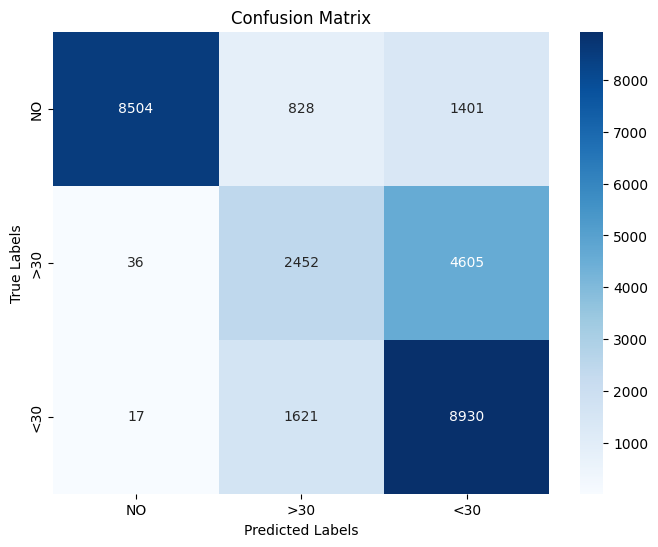

In [ ]:
y_pred_rf, y_pred_prob_rf, rf_metrics_list = evaluate_model(best_rf_model, X_test, y_test)

## **KNN** 

### **Model** 

In [ ]:
# Create and train the K-nearest neighbors model
def knn_model(X, y, params, nsplits, scoring_metric):
    """
    Create and train a K-nearest neighbors model using grid search for hyperparameter tuning.

    Parameters:
      X (pd.DataFrame): Feature matrix.
      y (pd.Series): Target variable.
      params (dict): Hyperparameter grid for grid search.
      nsplits (int): Number of splits for cross-validation.
      scoring_metric (str): Scoring metric for grid search.

    Returns:
      grid_search (GridSearchCV): Trained grid search object.
      best_knn_model (KNeighborsClassifier): Trained K-nearest neighbors model with best hyperparameters.
    """
    # Define an KNN model
    knn_model = KNeighborsClassifier()

    # Perform grid search with stratified 10-fold cross-validation  
    cv = StratifiedKFold(n_splits=nsplits)
    grid_search = GridSearchCV(knn_model, param_grid, cv=cv, scoring=scoring_metric)

    grid_search.fit(X, y)

    # Get the best hyperparameters
    best_params = grid_search.best_params_

    best_knn_model = KNeighborsClassifier(**best_params)
    best_knn_model.fit(X, y)

    return grid_search, best_knn_model

# Set up a grid of hyperparameters to search
param_grid = {
    'n_neighbors': [3, 5, 7, 9],
    'weights': ['uniform', 'distance'],
    'p': [1, 2]  # 1 for Manhattan distance, 2 for Euclidean distance
}

knn_gs, best_knn_model = knn_model(X_train, y_train, params=param_grid, nsplits=10, scoring_metric='f1_weighted')

### **Predictions and Evaluation** 

In [ ]:
# Optimal parameters
knn_gs.best_params_

{'n_neighbors': 9, 'p': 1, 'weights': 'distance'}

Accuracy: 0.68
Precision: 0.66
Recall: 0.68
F1 Score: 0.67
ROC-AUC: 0.83


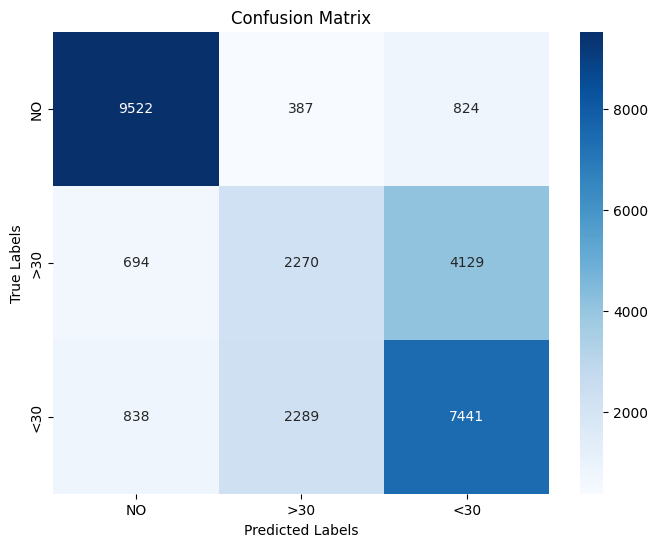

In [ ]:
# Generate predictions, evaluate the model, produce relevant plots
y_pred_knn, y_pred_prob_knn, knn_metrics_list = evaluate_model(best_knn_model, X_test, y_test)

## **SVM** 

### **Model** 

In [ ]:
# Assuming X_train and y_train are your training data and labels
X_train_svm, X_remainder_svm, y_train_svm, y_remainder_svm = train_test_split(
    X_train, y_train, test_size=0.8, stratify=y_train, random_state=42
)

In [ ]:
def svm_model(X, y, params, nsplits, scoring_metric):
    """
    Create and train a Support Vector Machine (SVM) model using grid search for hyperparameter tuning.

    Parameters:
    - X (pd.DataFrame): Feature matrix.
    - y (pd.Series): Target variable.
    - params (dict): Hyperparameter grid for grid search.
    - nsplits (int): Number of splits for cross-validation.
    - scoring_metric (str): Scoring metric for grid search.

    Returns:
    - grid_search (GridSearchCV): Trained grid search object.
    - best_svm_model (SVC): Trained SVM model with best hyperparameters.
    """
    # Define an SVM model
    svm_model = SVC(random_state=42)

    # Perform grid search with stratified 10-fold cross-validation
    cv = StratifiedKFold(n_splits=nsplits)
    grid_search = GridSearchCV(svm_model, param_grid, cv=cv, scoring=scoring_metric)

    # Fit the model within the loop
    grid_search.fit(X_train, y_train)

    # Get the best hyperparameters
    best_params = grid_search.best_params_

    # Train the SVM model with the best hyperparameters
    best_svm_model = SVC(**best_params, random_state=42)

    # Fit the model within the loop
    best_svm_model.fit(X_train, y_train)

    return grid_search, best_svm_model

# Set up a grid of hyperparameters to search
param_grid = {
    'C': [0.01, 0.1, 1, 10, 100],
    'kernel': ['linear', 'poly', 'rbf'],
}

svm_gs, best_svm_model = svm_model(X_train, y_train, params=param_grid, nsplits=10, scoring_metric='f1_weighted')

### **Predictions and Evaluation** 

In [ ]:
# Optimal parameters
svm_gs.best_params_

In [ ]:
# Generate predictions, evaluate the model, produce relevant plots
y_pred_svm, y_pred_prob_svm, svm_metrics_list = evaluate_model(best_svm_model, X_test, y_test)

## **CNN** 

### **Model** 

In [58]:
# Function to create the CNN model
def create_cnn_model(optimizer='adam', filters=64, kernel_size=3, dense_units=256, dropout_rate=0.5):
    model = Sequential()
    model.add(Conv1D(filters, kernel_size=kernel_size, activation='relu', input_shape=input_shape))
    model.add(MaxPooling1D(pool_size=2))
    model.add(Conv1D(filters * 2, kernel_size=kernel_size, activation='relu'))
    model.add(MaxPooling1D(pool_size=2))
    model.add(Flatten())
    model.add(Dense(dense_units, activation='relu'))
    model.add(Dropout(dropout_rate))
    model.add(Dense(num_classes, activation='softmax'))
    
    model.compile(loss='sparse_categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])
    return model

# Assuming X_train is a NumPy array
X_train_df = pd.DataFrame(X_train)

# Now you can use X_train_df.values
X_train_reshaped = X_train_df.values.reshape(X_train_df.shape[0], X_train_df.shape[1], 1)

# Assuming num_classes is the number of unique classes in your target variable
num_classes = len(np.unique(y_train))

# Input shape for 1D CNN
input_shape = (X_train_reshaped.shape[1], 1)

# Create KerasClassifier
model = KerasClassifier(build_fn=create_cnn_model, input_shape=input_shape, epochs=5, batch_size=32, verbose=0)

print(model.get_params().keys())

# Define the hyperparameter grid
param_dist = {
    'optimizer': ['adam', 'rmsprop'],
    'filters': [64, 128, 256],
    'kernel_size': [3, 5, 7],
    'dense_units': [128, 256, 512],
    'dropout_rate': [0.3, 0.5, 0.7]
}

# Perform randomized search
random_search = RandomizedSearchCV(model, param_distributions=param_dist, cv=StratifiedKFold(n_splits=3), scoring='accuracy', n_iter=10)
random_search_results = random_search.fit(X_train_reshaped, y_train)

# Get the best parameters
best_params = random_search_results.best_params_

# Build the model with the best parameters
best_cnn_model = create_cnn_model(optimizer=best_params['optimizer'], filters=best_params['filters'],
                                   kernel_size=best_params['kernel_size'], dense_units=best_params['dense_units'],
                                   dropout_rate=best_params['dropout_rate'])

# Train the model and keep track of training and validation metrics
history = best_cnn_model.fit(X_train_reshaped, y_train, epochs=10, batch_size=32, validation_split=0.2, verbose=1)

# Plot training and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot training and validation accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


dict_keys(['model', 'build_fn', 'warm_start', 'random_state', 'optimizer', 'loss', 'metrics', 'batch_size', 'validation_batch_size', 'verbose', 'callbacks', 'validation_split', 'shuffle', 'run_eagerly', 'epochs', 'input_shape', 'class_weight'])


ValueError: Invalid parameter filters for estimator KerasClassifier.
This issue can likely be resolved by setting this parameter in the KerasClassifier constructor:
`KerasClassifier(filters=64)`
Check the list of available parameters with `estimator.get_params().keys()`

In [71]:
# Assuming X_train is a NumPy array
X_train_df = pd.DataFrame(X_train)
X_train_reshaped = X_train_df.values.reshape(X_train_df.shape[0], X_train_df.shape[1], 1)

# Assuming num_classes is the number of unique classes in your target variable
num_classes = len(np.unique(y_train))

# Input shape for 1D CNN
input_shape = (X_train_reshaped.shape[1], 1)

In [90]:
input_shape

(135, 1)

In [100]:
# Function to create the CNN model
def build_model(hp):
    model = keras.Sequential()

    # Convolutional layers
    for i in range(hp.Int('num_conv_layers', min_value=5, max_value=10)):
        model.add(layers.Conv1D(filters=hp.Int(f'filters_{i}', min_value=32, max_value=256, step=32),
                                kernel_size=hp.Choice(f'kernel_size_{i}', values=[5, 7, 9]),
                                activation='relu',
                                input_shape=input_shape))

    model.add(layers.MaxPooling1D(pool_size=2))

    model.add(layers.Flatten())

    # Dense layers
    for i in range(hp.Int('num_dense_layers', min_value=2, max_value=4)):
        model.add(layers.Dense(units=hp.Int(f'dense_units_{i}', min_value=128, max_value=512, step=128),
                               activation='relu'))
        model.add(layers.Dropout(rate=hp.Float(f'dropout_rate_{i}', min_value=0.2, max_value=0.7, step=0.2)))

    # Output layer
    model.add(layers.Dense(num_classes, activation='softmax'))

    opt = keras.optimizers.Adam(learning_rate=0.0001)

    # Compile the model
    model.compile(optimizer=opt,
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

    return model

# Define callbacks
reduce_lr = keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=0,mode='min',verbose=1)
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=4, restore_best_weights=True,verbose=1)

# Instantiate the tuner
tuner = RandomSearch(
    build_model,
    objective='val_accuracy',
    max_trials=10,  # Number of hyperparameter combinations to try
    directory='cnn_hypertuning',  # Directory to store the search results
    project_name='cnn_hyperparameter_tuning'
)

# Search for the best hyperparameters
tuner.search(X_train_reshaped, y_train, epochs=10, validation_split=0.2, callbacks=[reduce_lr, early_stop])




Search: Running Trial #1

Value             |Best Value So Far |Hyperparameter
5                 |5                 |num_conv_layers
256               |256               |filters_0
5                 |5                 |kernel_size_0
64                |64                |filters_1
5                 |5                 |kernel_size_1
192               |192               |filters_2
9                 |9                 |kernel_size_2
160               |160               |filters_3
5                 |5                 |kernel_size_3
64                |64                |filters_4
5                 |5                 |kernel_size_4
3                 |3                 |num_dense_layers
128               |128               |dense_units_0
0.2               |0.2               |dropout_rate_0
512               |512               |dense_units_1
0.4               |0.4               |dropout_rate_1

Epoch 1/10
  52/2003 [..............................] - ETA: 3:19 - loss: 1.0267 - accuracy: 0.5126

### **Predictions and Evaluation** 

In [ ]:
# Get the best hyperparameters
best_hyperparameters = tuner.oracle.get_best_trials(num_trials=1)[
    0
].hyperparameters.values

print(best_hyperparameters)

In [ ]:
# Build the model with the best hyperparameters
best_cnn_model = tuner.get_best_models(num_models=1)[0]